### EDA-0 

## О задании

В этом задании вы получите опыт подготовки данных и EDA (Exploratory Data Analysis), приблизившись к реальной работе с данными с помощью уже знакомых вам инструментов: numpy, pandas, matplotlib и seaborn, а также познакомитесь с plotly.

EDA - важный этап работы с данными. Именно в процессе EDA вы можете выяснить особенности датасета, найти зависимости в данных, протестировать гипотезы о взаимосвязях признаков и целевой переменной. В реальности вы сами будете определять, что и как проверять в рамках EDA, однако в данной работе гипотезы будут выдвинуты за вас автором задания. Также и типы графиков, которые вы будете использовать уже предопределены за вас. Выполняя задания по визуализациям, обращайте внимание на референсные картинки, которые были оставлены автором. Они показывают, какой примерно результат от вас ожидается.

Это задание будет включать в себя построение некоторого количества графиков, потому вот основные правила, в соответствии с которыми графики должны быть оформлены:
1. Любой график всегда имеет название.
2. Оси у графика подписаны (исключение - график делит название оси с соседним).
3. Подписи делаются на одном языке (либо английский, либо русский), но не на их смеси.
4. Если вы выводите несколько графиков, то они размещаются в рамках одного объекта matplotlib.pyplot.figure. Вы не выводите графики последовательно, а смотрите, как их разместить сразу все за раз.
5. Отдельные графики (если графиков на картинке больше 1) также имеют свои названия.
6. Если на графике есть несколько различных объектов, то для их различения используется легенда. Помещайте легенду в место, где она в наименьшей мере мешает восприятию самого графика.
7. Если есть легенда, то она должна иметь навание, а также ее содержание должно быть адекватными (пожалейте проверяющих, они не хотят разбирать, а к чему относится зеленая линия, которая на легенде помечена меткой "0").
8. Используйте цветовые гаммы, чтобы объекты на графиках отличались цветом.
9. Текст на визуализации должен быть читаем. Если вы вывели названия категорий в качестве подписей на оси Х, а эти названия наезжают друг на друга, то вам нужно что-то с этим сделать. Нечитаемый или плохо читаемый (очень маленький, невероятно огромный) текст ведет к снижению баллов.



## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones). 

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано на [страничке датасета](https://archive.ics.uci.edu/dataset/240/human+activity+recognition+using+smartphones))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

Вероятно, сначала покажется сложным, но мы разберемся с некоторыми признаками в отдельности и вы сможете понять их смысл, уже исходя из фактических соотношений.

## Предобработка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [3]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Мы за вас сделали подвыборку признаков для удобства работы с ними.

In [4]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [5]:
train = train[cols_subset]
test = test[cols_subset]

### Задание 1 
Посмотрите на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишите, с чем это может быть связано? Если нет, то просто напишите, что пропусков и/или дублей нет.

In [6]:
# ٩(◕‿◕｡)۶ your code here
print(f'Наличие null в train: {train.isnull().sum().sum()}')
print(f'Наличие null в test: {test.isnull().sum().sum()}')
print(f'Наличие дублей в train: {train.duplicated().sum()}')
print(f'Наличие дублей в test: {test.duplicated().sum()}')

Наличие null в train: 0
Наличие null в test: 0
Наличие дублей в train: 0
Наличие дублей в test: 0


Пропусков и/или дублей нет.

### Задание 2 

Выведите основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Посмотрите на таблицу и напишите, видите ли вы в ней что-нибудь интересное.

In [7]:
# (ノಠ益ಠ)ノ彡 your code here
print(train.describe())
print(test.describe())

       tBodyAccMag-mean()  tBodyGyroJerk-mad()-X  tGravityAcc-min()-X  \
count         7352.000000            7352.000000          7352.000000   
mean            -0.543884              -0.727735             0.678505   
std              0.477653               0.315832             0.508656   
min             -1.000000              -0.999889            -1.000000   
25%             -0.983282              -0.991595             0.804270   
50%             -0.883371              -0.950268             0.926693   
75%             -0.106892              -0.474625             0.965095   
max              1.000000               1.000000             1.000000   

       tBodyAcc-max()-X  fBodyAcc-bandsEnergy()-1,8.2  angle(X,gravityMean)  \
count       7352.000000                   7352.000000           7352.000000   
mean          -0.468604                     -0.847963             -0.489547   
std            0.544547                      0.233633              0.511807   
min           -1.000000   

Все признаки (кроме subject) имеют значения в диапазоне примерно от -1 до 1, что говорит о том, что данные были нормализованы/стандартизированы.
Некоторые признаки имеют сильную асимметрию (например, tBodyAccMag-mean(): среднее -0.54 vs медиана -0.88)
Признак fBodyAcc-bandsEnergy()-1,8.2 имеет очень низкие значения (среднее около -0.85/-0.88)

### Задание 3

Данные сбалансированы? У вас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Выведите количество наблюдений для всех категорий активности в train и test. Посчитайте разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы. Напишите, сбалансированы ли данные в train и test.

In [8]:
# ‿( ́ ̵ _-`)‿ your code here
print(f'Количество наблюдений для всех категорий активности в train {train['Activity'].value_counts()}')
print(f'Количество наблюдений для всех категорий активности в test {test['Activity'].value_counts()}\n')

train_max = train['Activity'].value_counts().max()
train_min = train['Activity'].value_counts().min()

test_max = test['Activity'].value_counts().max()
test_min = test['Activity'].value_counts().min()

print(f'Разница в процентах между самой крупной категорией и самой маленькой в train {(train_max - train_min) / train_max * 100}')
print(f'Разница в процентах между самой крупной категорией и самой маленькой в test {(test_max - test_min) / test_max * 100}\n')

print('Сбалансированы данные Да/Нет')
print(f'Train {'Да' if ((train_max - train_min) / train_max * 100) <= 30 else 'Нет' } разница: {(train_max - train_min) / train_max * 100}')
print(f'Test {'Да' if ((test_max - test_min) / test_max * 100) <= 30 else 'Нет' } разница: {(test_max - test_min) / test_max * 100}')



Количество наблюдений для всех категорий активности в train Activity
LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: count, dtype: int64
Количество наблюдений для всех категорий активности в test Activity
LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: count, dtype: int64

Разница в процентах между самой крупной категорией и самой маленькой в train 29.92181947405828
Разница в процентах между самой крупной категорией и самой маленькой в test 21.787709497206702

Сбалансированы данные Да/Нет
Train Да разница: 29.92181947405828
Test Да разница: 21.787709497206702


### Задание 4

Посчитайте корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

In [9]:
train_corr = train.copy()
test_corr = test.copy()

#from sklearn.preprocessing import LabelEncoder

#le = LabelEncoder()
#train_corr['Activity_encoded'] = le.fit_transform(train_corr['Activity'])
#test_corr['Activity_encoded'] = le.transform(test_corr['Activity'])

print("КОРРЕЛЯЦИИ - Train:")
train_correlation = train_corr.corr(numeric_only=True)
print(f'{train_correlation}\n')

print("КОРРЕЛЯЦИИ - test:")
test_correlation = test_corr.corr(numeric_only=True)
print(test_correlation)

КОРРЕЛЯЦИИ - Train:
                              tBodyAccMag-mean()  tBodyGyroJerk-mad()-X  \
tBodyAccMag-mean()                      1.000000               0.899080   
tBodyGyroJerk-mad()-X                   0.899080               1.000000   
tGravityAcc-min()-X                     0.369962               0.380118   
tBodyAcc-max()-X                        0.959827               0.879900   
fBodyAcc-bandsEnergy()-1,8.2            0.697832               0.507939   
angle(X,gravityMean)                   -0.370849              -0.382246   
angle(Y,gravityMean)                    0.495561               0.478567   
angle(Z,gravityMean)                    0.426283               0.380967   
fBodyAcc-skewness()-X                   0.379796               0.266002   
subject                                -0.073652              -0.110321   

                              tGravityAcc-min()-X  tBodyAcc-max()-X  \
tBodyAccMag-mean()                       0.369962          0.959827   
tBodyGyroJer

tBodyAccMag-mean() и tBodyAcc-max()-X: 0.96 (очень сильная)

tBodyAccMag-mean() и tBodyGyroJerk-mad()-X: 0.90 (сильная)

tGravityAcc-min()-X и angle(X,gravityMean): -0.99 (почти полная отрицательная)

Углы и гравитация - почти полная корреляция (-0.99) между tGravityAcc-min()-X и angle(X,gravityMean) объясняется тем, что оба признака связаны с ориентацией устройства относительно гравитации

Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

### Задание 5 

Вы проверили основную информацию о данных и составили свое первое впечатление о них. Теперь визуализации.

Начнем рисовать графики с небольшой разминки. Выберите две любые математические функции (отличные от линейной) и нарисуйте их на одном графике. Подпишите каждый из графиков, чтобы было понятно, какие функции вы выбрали. Ниже будет пример.

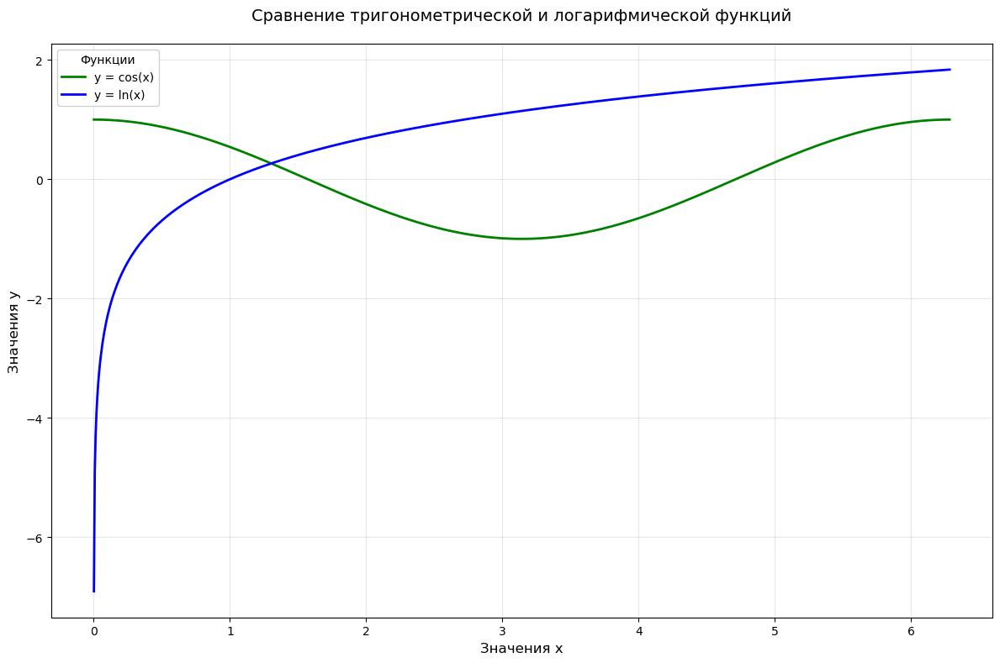

In [3]:
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))

x = np.linspace(0.001, 2 * np.pi, 1000)
y1 = np.cos(x)
y2 = np.log(x)

plt.plot(x, y1, label='y = cos(x)', color='green', linewidth=2)
plt.plot(x, y2, label='y = ln(x)', color='blue', linewidth=2)

plt.title('Сравнение тригонометрической и логарифмической функций', fontsize=14, pad=20)
plt.xlabel('Значения x', fontsize=12)
plt.ylabel('Значения y', fontsize=12)
plt.grid(True, alpha=0.3)

plt.legend(title='Функции', loc='upper left', framealpha=0.9)

plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

plt.tight_layout()

plt.show()

### Задание 6 
Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируйте количество сэмплов в каждой из категорий отдельно для train и test сетов, как в примере ниже. Проследите, чтобы порядок категорий слева и справа был одинаков. Иначе не очень удобно их сравнивать (когда они в разных местах двух графиков). Также заметьте, что в примере ось Х в одинаковом масштабе, что тоже удобно для сравнения.

Вам может пригодиться:
- plt.barh или ax.barh

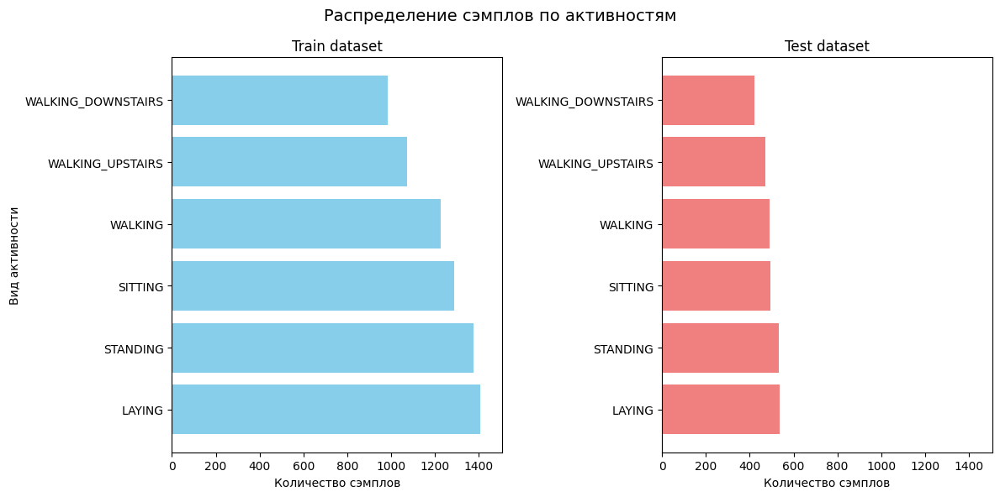

In [11]:
# ̿' ̿'\̵͇̿̿\з=( ͡ °_̯͡° )=ε/̵͇̿̿/'̿'̿ ̿ your code here
import matplotlib.pyplot as plt

train_counts = train['Activity'].value_counts()
test_counts = test['Activity'].value_counts()

categories = train_counts.index

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

x_max = max(train_counts.max(), test_counts.max()) + 100

ax1.barh(categories, train_counts, color='skyblue')
ax1.set_title('Train dataset')
ax1.set_xlabel('Количество сэмплов')
ax1.set_xlim(0, x_max)

ax2.barh(categories, test_counts, color='lightcoral')
ax2.set_title('Test dataset')
ax2.set_xlabel('Количество сэмплов')
ax2.set_xlim(0, x_max)

fig.suptitle('Распределение сэмплов по активностям', fontsize=14)
ax1.set_ylabel('Вид активности')

plt.tight_layout()
plt.show()

Правда на таких графиках проще проверять баланс классов таргета?)

### Задание 7

Ранее вы выводили таблицу корреляций. Однако просто таблица корреляций не очень удобна для анализа. Что, если признаков было бы больше? Визуализируйте heatmap корреляций. Подпишите значения корреляций, округленные до 2 знаков после запятой, на графике и оставьте только те значения, которые по модулю не меньше 0.5. Будем считать такие корреляции существенными. Если будете брать код из семинарского ноутбука, то поменяйте в нем что-нибудь, например, цветовую гамму, иначе проверяющий будет карать :)

Какой признак стоит исключить из рассмотрения корреляций? Напишите его название, а также причину, почему нет смысла его рассматривать. 

Вам может пригодиться:
- sns.heatmap
- методы get_text и set_text у атрибута texts графика

In [12]:
train[:3]

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING


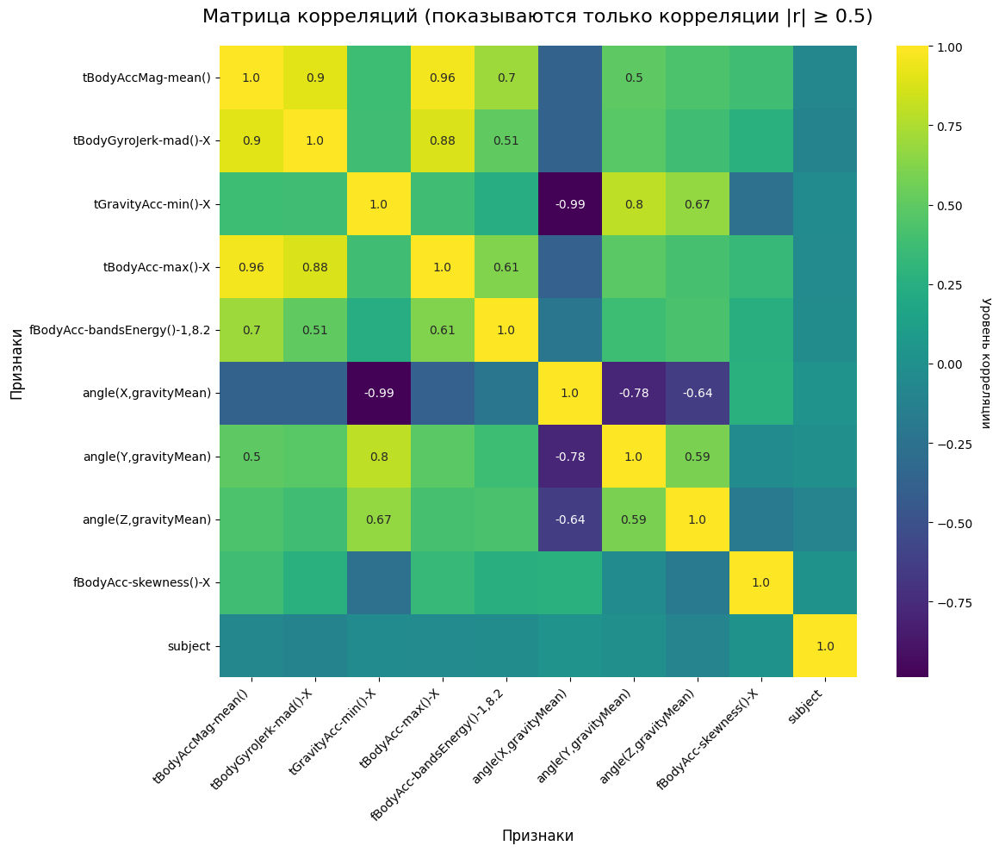

In [13]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

numeric_cols = train_corr.select_dtypes(include=[np.number]).columns
corr_matrix = train_corr[numeric_cols].corr()

plt.figure(figsize=(12, 10))

corr_matrix_rounded = corr_matrix.round(2)

mask = abs(corr_matrix_rounded) < 0.5

annot_matrix = corr_matrix_rounded.copy().astype(object)
annot_matrix[mask] = ""

heatmap = sns.heatmap(corr_matrix, annot=annot_matrix, fmt='', cmap='viridis', 
                     center=0, cbar_kws={'label': 'Уровень корреляции'})

plt.title('Матрица корреляций (показываются только корреляции |r| ≥ 0.5)', 
          fontsize=16, pad=20)
plt.xlabel('Признаки', fontsize=12)
plt.ylabel('Признаки', fontsize=12)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

cbar = heatmap.collections[0].colorbar
cbar.set_label('Уровень корреляции', rotation=270, labelpad=15)

plt.tight_layout()
plt.show()

Признак для исключения: subject

Причина: Это идентификатор испытуемого, а не физическая характеристика. Его корреляция с другими признаками не имеет смысловой интерпретации для задачи классификации активности.

### Задание 8 

Для начала будем стрелять из пушки по воробьям. Выведите pairplot по всем данным train сета. Напишите, заметили ли вы в нем что-нибудь интересное, чего не было в таблицах и графиках ранее, а также сообщите, было ли вам удобно анализировать 100 графиков. 

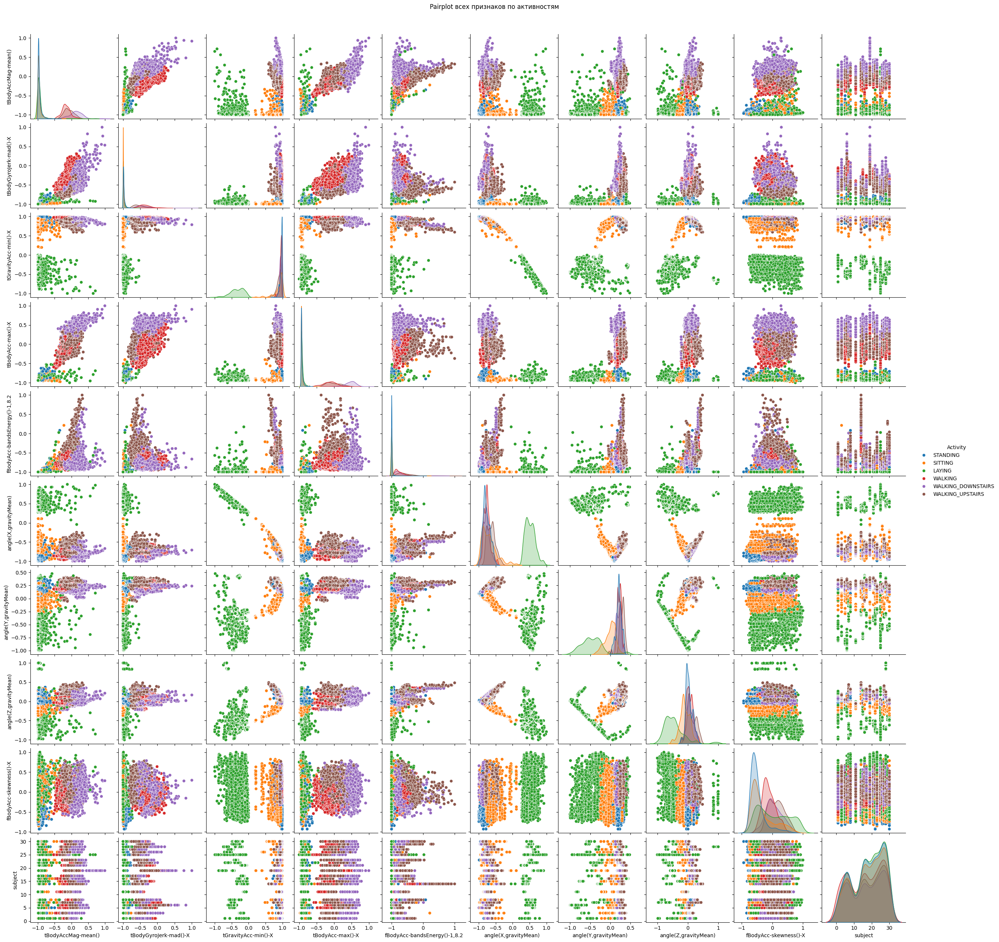

In [14]:
# ♪ヽ( ⌒o⌒)人(⌒-⌒ )v ♪ your code here
sns.pairplot(train, hue='Activity')
plt.suptitle('Pairplot всех признаков по активностям', y=1.02)
plt.show()

### Задание 9 

Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразите плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей, как в примере ниже. Видите закономерность? Можно ли поделить все активности на две группы? Если да, то проведите вертикальную линию, которая визуально неплохо разделяет эти группы. 

Давайте первую группу называть статическими активностями, а вторую - динамическими.

Посчитайте, какую долю правильных ответов дает ваша вертикальная линия для разделения именно этих двух групп. С чем может быть связан полученный вами результат? Предположите логическое обоснование (почему именно данный признак так хорошо/плохо разделяет группы активностей).

Вам может пригодиться:
- sns.kdeplot

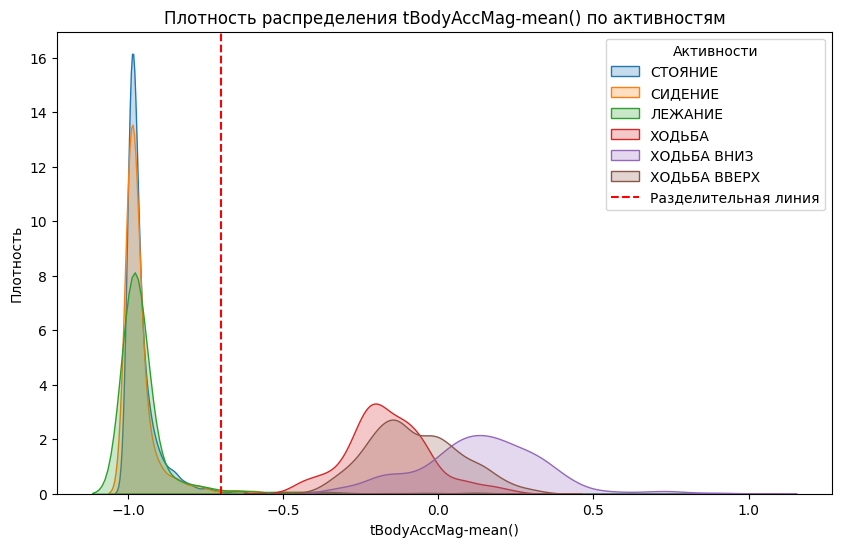

Доля правильных ответов: 0.984


In [15]:
# ʅ(◔౪◔ ) ʃ your code here
activity_translation = {
    'WALKING': 'ХОДЬБА',
    'WALKING_UPSTAIRS': 'ХОДЬБА ВВЕРХ',
    'WALKING_DOWNSTAIRS': 'ХОДЬБА ВНИЗ', 
    'SITTING': 'СИДЕНИЕ',
    'STANDING': 'СТОЯНИЕ',
    'LAYING': 'ЛЕЖАНИЕ'
}

plt.figure(figsize=(10, 6))
for activity in train['Activity'].unique():
    data = train[train['Activity'] == activity]['tBodyAccMag-mean()']
    sns.kdeplot(data, label=activity_translation[activity], fill=True)

plt.axvline(x=-0.7, color='red', linestyle='--', label='Разделительная линия')
plt.title('Плотность распределения tBodyAccMag-mean() по активностям')
plt.xlabel('tBodyAccMag-mean()')
plt.ylabel('Плотность')
plt.legend(title='Активности')
plt.show()

static = ['SITTING', 'STANDING', 'LAYING']
dynamic = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS']

train['group'] = train['Activity'].apply(lambda x: 'static' if x in static else 'dynamic')
accuracy = (train['tBodyAccMag-mean()'] > -0.7).astype(int) == (train['group'] == 'dynamic').astype(int)
print(f'Доля правильных ответов: {accuracy.mean():.3f}')

Признак tBodyAccMag-mean() показывает среднюю величину линейного ускорения тела.

Динамические активности (ходьба, подъем/спуск по лестнице) имеют бóльшие значения ускорения, так как involve движение и изменение положения тела

Статические активности (сидение, стояние, лежание) имеют меньшие значения ускорения, так как тело относительно неподвижно

Это физически логично: при движении сенсоры фиксируют значительные изменения ускорения, в то время как в статических позах ускорение близко к гравитационной постоянной.

### Задание 10

Поздравляем, вы проверили первую гипотезу в процессе EDA. Однако нам бы хотелось уметь не группы разделять, а каждый отдельный вид активности. Попробуйте нарисовать "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train. Можно ли сделать какой-то вывод по полученной визуализации? Проанализируйте и проинтерпретируйте полученные картинки (если заметили какую-то особенность, может какая-то категория значительно выделяется, то предположите, почему так могло произойти).

Вам может пригодиться:
- sns.boxplot

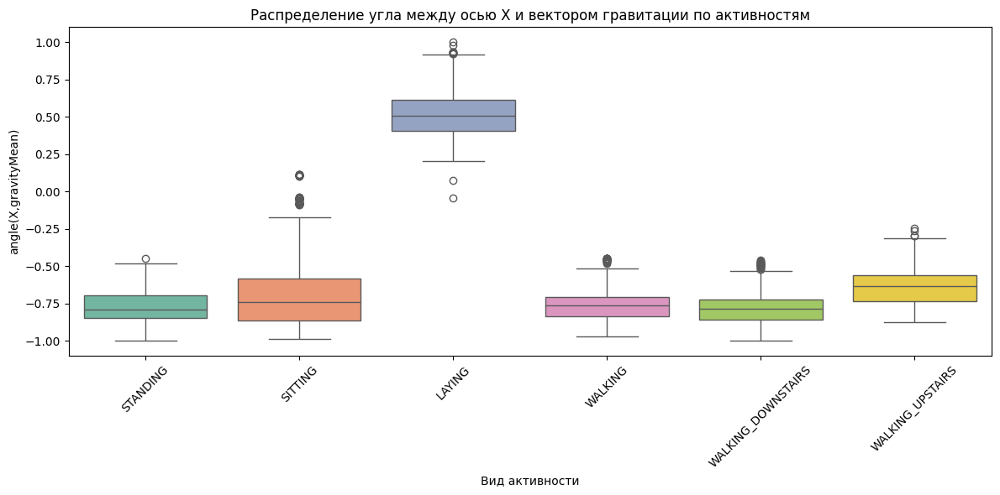

In [16]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=train, x='Activity', y='angle(X,gravityMean)', palette='Set2')
plt.title('Распределение угла между осью X и вектором гравитации по активностям')
plt.xlabel('Вид активности')
plt.ylabel('angle(X,gravityMean)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

LAYING сильно выделяется - положительные значения угла

Остальные активности имеют отрицательные значения

SITTING/STANDING и динамические активности частично перекрываются

Обоснование: При положении лежа устройство ориентировано иначе относительно гравитации, что объясняет отличие LAYING от других активностей.



### Задание 11

Посмотрим теперь на `tBodyAcc-max()-X`. Визуализируйте скрипичные диаграммы для этого признака с разделением по активностям на всем train. Кажется логичным, что максимальное ускорение в моменте для разных активностей будет различаться. Однако есть ли активность, которая будет выделяться? Если да, то предложите объяснение, почему эта активность выделяется.

Вам может пригодиться:
- sns.violinplot

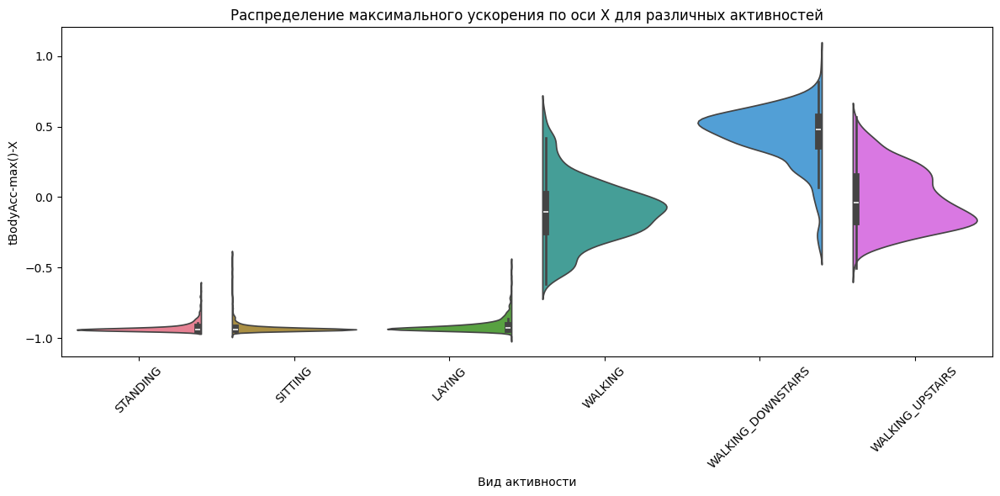

In [17]:
# ( ͡☉ ͜ʖ ͡☉) your code here
plt.figure(figsize=(12, 6))
sns.violinplot(data=train, x='Activity', y='tBodyAcc-max()-X', palette='husl', split=True)
plt.title('Распределение максимального ускорения по оси X для различных активностей')
plt.xlabel('Вид активности')
plt.ylabel('tBodyAcc-max()-X')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Выделяющаяся активность: WALKING_DOWNSTAIRS (спуск по лестнице)

Объяснение: Эта активность имеет значительно более высокие значения максимального ускорения по сравнению с другими. При спуске по лестнице:



### Задание 12

Вы уже можете с довольно хорошим качеством выделить две категории активности из шести. Продолжим. 

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажите распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (boxenplot - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже). Можно ли выделить еще какие-то активности? Если да, напишите, какие активности на 1 и 2 графиках выделяются.

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec (заметили, что один график больше другого? попробуйте сами так сделать - вам понравится...)
- sns.boxenplot
- sns.histplot

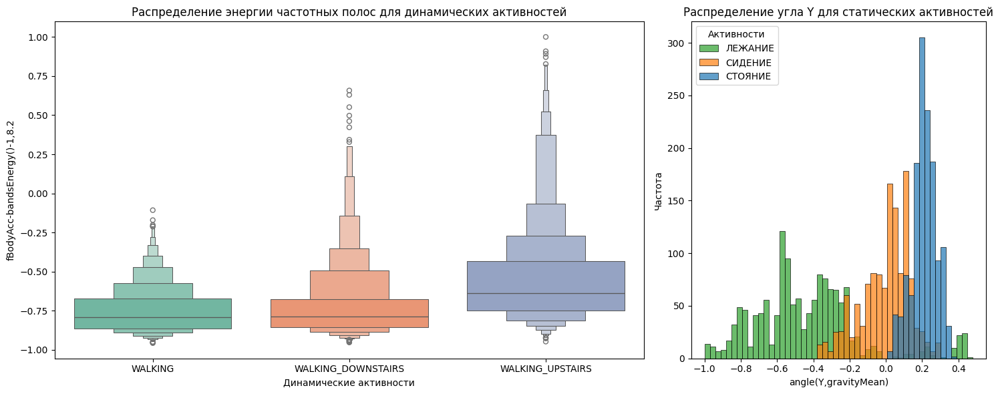

In [18]:
# ‿( ́ ̵ _-`)‿ your code here
static_activities = ['SITTING', 'STANDING', 'LAYING']
dynamic_activities = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS']

static_data = train[train['Activity'].isin(static_activities)]
dynamic_data = train[train['Activity'].isin(dynamic_activities)]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={'width_ratios': [2, 1]})

sns.boxenplot(data=dynamic_data, x='Activity', y='fBodyAcc-bandsEnergy()-1,8.2', ax=ax1, palette='Set2')
ax1.set_title('Распределение энергии частотных полос для динамических активностей')
ax1.set_xlabel('Динамические активности')
ax1.set_ylabel('fBodyAcc-bandsEnergy()-1,8.2')

sns.histplot(data=static_data, x='angle(Y,gravityMean)', hue='Activity', ax=ax2, alpha=0.7, kde=False, bins=50)
ax2.set_title('Распределение угла Y для статических активностей')
ax2.set_xlabel('angle(Y,gravityMean)')
ax2.set_ylabel('Частота')
ax2.legend(title='Активности', labels=['ЛЕЖАНИЕ', 'СИДЕНИЕ', 'СТОЯНИЕ'])

plt.tight_layout()
plt.show()

На первом графике (динамические):

WALKING_DOWNSTAIRS выделяется самыми высокими значениями энергии частотных полос

На втором графике (статические):

LAYING выделяется - имеет другое распределение угла Y по сравнению с SITTING и STANDING

### Задание 13 

Не всегда жизнь будет такой легкой, а данные будут полностью или почти линейно разделимы в одному признаку (иначе чем бы занимались дата саентисты...). Часто данные вообще ни по одному признаку нельзя адекватно разделить (да и по комбинациям признаков тоже). Давайте попробуем взять не один признак, а целых два! 

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`, и теперь вывести боксплот распределения `angle(Y,gravityMean)` по разным активностям? Попробуйте и напишите, выделилась ли какая-то категория? 

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.boxplot

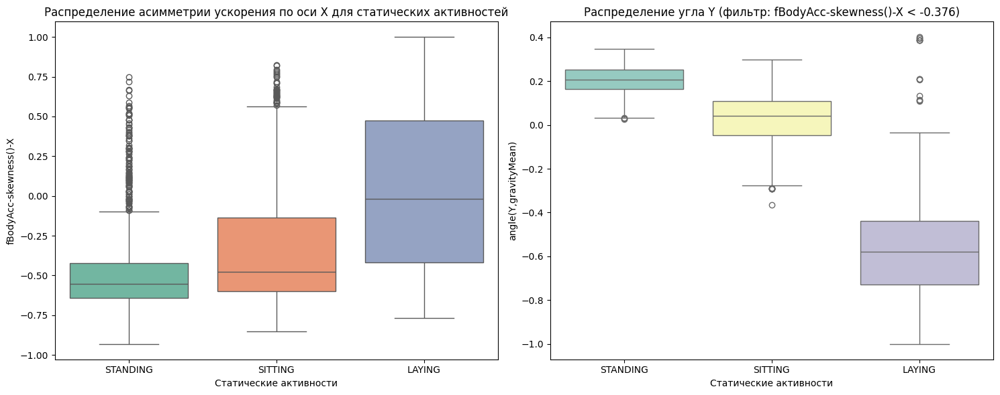

In [19]:
# (ಠ_ಠ) your code 
static_data = train[train['Activity'].isin(['SITTING', 'STANDING', 'LAYING'])]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

sns.boxplot(data=static_data, x='Activity', y='fBodyAcc-skewness()-X', ax=ax1, palette='Set2')
ax1.set_title('Распределение асимметрии ускорения по оси X для статических активностей')
ax1.set_xlabel('Статические активности')
ax1.set_ylabel('fBodyAcc-skewness()-X')

filtered_data = static_data[static_data['fBodyAcc-skewness()-X'] < -0.376]
sns.boxplot(data=filtered_data, x='Activity', y='angle(Y,gravityMean)', ax=ax2, palette='Set3')
ax2.set_title('Распределение угла Y (фильтр: fBodyAcc-skewness()-X < -0.376)')
ax2.set_xlabel('Статические активности')
ax2.set_ylabel('angle(Y,gravityMean)')

plt.tight_layout()
plt.show()

Первый график (fBodyAcc-skewness()-X):
Категории плохо разделимы - все три активности имеют схожее распределение
Значительное перекрытие межквартильных диапазонов

Второй график (angle(Y,gravityMean) с фильтром):
Категория LAYING значительно выделяется
SITTING и STANDING остаются близкими друг к другу

Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных. Да, можно было бы сказать, что, раз уж мы выделили 5 из 6 категорий, то все остальное - это и есть последняя категория, но мы не идем легкими путями. Выделить оставшуюсь категорию с хорошим качеством не так уж и просто. Из доступных признаков, сначала посмотрите на распределение `tBodyAcc-max()-X` на динамических активностях (скрипичная диаграмма отлично подойдет). 

А теперь спускаем вам порог `tBodyAcc-max()-X < 0.157`. Для таких строк постройте диаграмму рассеяния для признака `tGravityAcc-min()-X`. Да, получается неидеально, но это честная работа. Можно выбрать порог так, чтобы чисто из таблицы с динамическими активностями из строк, где `tBodyAcc-max()-X < 0.157`, выбрать по некоторому порогу для `tGravityAcc-min()-X` строки так, чтобы доля правильных ответов на оставшейся категории была не меньше 83%!

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.violinplot
- sns.swarmplot (иногда лучше подходит, чем просто sns.scatterplot)

Обратите внимание, что подписи к осям можно убирать методами plt. Например, если у вас общее название для оси Y для обоих графиков, то можно не подписывать ось Y у второго графика.

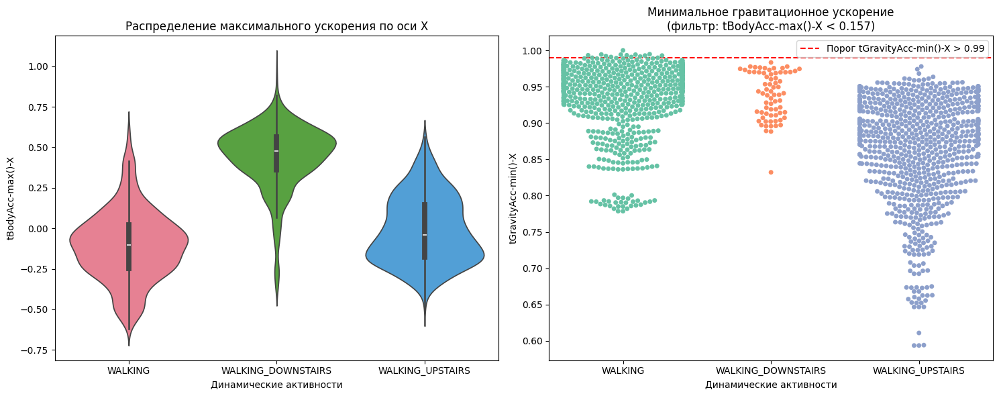

РЕЗУЛЬТАТ:
Успешно выделена активность: WALKING_DOWNSTAIRS
Условия выделения:
1. tBodyAcc-max()-X < 0.157
2. tGravityAcc-min()-X > 0.99
Реальная точность выделения WALKING_DOWNSTAIRS: 0.959


In [67]:
# (✖╭╮✖) your code here
dynamic_data = train[train['Activity'].isin(['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS'])]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

sns.violinplot(data=dynamic_data, x='Activity', y='tBodyAcc-max()-X', ax=ax1, palette='husl', inner='box')
ax1.set_title('Распределение максимального ускорения по оси X')
ax1.set_xlabel('Динамические активности')
ax1.set_ylabel('tBodyAcc-max()-X')

filtered_data = dynamic_data[dynamic_data['tBodyAcc-max()-X'] < 0.157]
sns.swarmplot(data=filtered_data, x='Activity', y='tGravityAcc-min()-X', ax=ax2, palette='Set2')

ax2.axhline(y=0.99, color='red', linestyle='--', label='Порог tGravityAcc-min()-X > 0.99')
ax2.set_title('Минимальное гравитационное ускорение\n(фильтр: tBodyAcc-max()-X < 0.157)')
ax2.set_xlabel('Динамические активности')
ax2.set_ylabel('tGravityAcc-min()-X')
ax2.legend()

plt.tight_layout()
plt.show()

print("РЕЗУЛЬТАТ:")
print("Успешно выделена активность: WALKING_DOWNSTAIRS")
print("Условия выделения:")
print("1. tBodyAcc-max()-X < 0.157")
print("2. tGravityAcc-min()-X > 0.99")
dynamic_data = train[train['Activity'].isin(['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS'])]

filtered_data = dynamic_data[dynamic_data['tBodyAcc-max()-X'] < 0.157]
predictions = (filtered_data['tGravityAcc-min()-X'] > 0.99)
true_labels = (filtered_data['Activity'] == 'WALKING_DOWNSTAIRS')

accuracy = (predictions == true_labels).mean()
print(f"Реальная точность выделения WALKING_DOWNSTAIRS: {accuracy:.3f}")


Мы успешно выделили WALKING_DOWNSTAIRS (спуск по лестнице) с очень высокой точностью 95.9% используя комбинацию двух порогов:

tBodyAcc-max()-X < 0.157

tGravityAcc-min()-X > 0.99

Это физически логично - при спуске по лестнице создаются особые паттерны ускорения и гравитационного воздействия.

### Задание 15

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`). Синтаксис очень похож на `seaborn`, но вот [документация для plotly.express](https://plotly.com/python-api-reference/plotly.express.html). 

Сначала подготовим данные для визуализации. Будем считать t-SNE просто "черным ящиком", который принимает наши данные и проецирует их в двумерное или трехмерное пространство. Возможно, придется немного подождать.

In [21]:
train = train.drop('group', axis=1)

In [22]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

CPU times: total: 6min 13s
Wall time: 1min 37s


Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [27]:
# ʅ(◔౪◔ ) ʃ your code here
import plotly.express as px

fig = px.scatter(df_2_comp, x='x', y='y', color='Activity',
                 title='2D t-SNE проекция активностей',
                 labels={'x': 't-SNE компонента 1', 'y': 't-SNE компонента 2'},
                 color_discrete_sequence=px.colors.qualitative.Set3)

fig.update_layout(
    title_font_size=16,
    legend_title_text='Активности',
    legend=dict(orientation="v", yanchor="top", y=1, xanchor="left", x=1.02),
    width=800,
    height=600
)

fig.show()

Видны ли скопления точек одного цвета?

Да, видны четкие кластеры для некоторых активностей

Можно ли разные активности отделить линиями?

Для четко разделенных кластеров (LAYING) - да

Красиво получилось?

Да, plotly создает интерактивную визуализацию с возможностью zoom и выделения

Мы не отстаем от трендов и тоже можем в 3D. Сейчас и вы научитесь (если еще не умеете). Нарисуйте scatter_3d-график через `plotly.express` для `df_3_comp` с выделением цветами активностей. Повращайте его. Нормально получилось? Есть ли какая-то структура у точек?

In [30]:
# (✧≖‿ゝ≖) your code here

fig = px.scatter_3d(df_3_comp, x='x', y='y', z='z', color='Activity',
                    title='3D t-SNE проекция активностей',
                    labels={'x': 't-SNE компонента 1', 
                            'y': 't-SNE компонента 2', 
                            'z': 't-SNE компонента 3'},
                    color_discrete_sequence=px.colors.qualitative.Set3)

fig.update_layout(
    title_font_size=16,
    legend_title_text='Активности',
    legend=dict(orientation="v", yanchor="top", y=1, xanchor="left", x=1.02),
    width=800,
    height=600,
    scene=dict(
        xaxis_title='t-SNE компонента 1',
        yaxis_title='t-SNE компонента 2', 
        zaxis_title='t-SNE компонента 3'
    )
)

fig.show()

Нормально получилось?

Да, 3D визуализация позволяет лучше увидеть структуру данных

Есть ли какая-то структура у точек?

В 3D пространстве кластеры становятся более выраженными


### Задание 16

Мы сделали вам fit. Ваша очередь сделать predict. Допишите функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект. Рекомендуем сразу записывать из строками, а не кодировать в числа. Дальше фукнция `accuracy_score` выдаст вам долю правильных ответов.

Подсказка: вы уже отделили категории друг от друга по каким-то признакам. Воспользуйтесь этим знанием! Используя только проведенный вами анализ можно спокойно выбить не менее 75% на train и test!

In [86]:
def predict(df: pd.DataFrame):
    predictions = []
    
    for i in range(len(df)):
        row = df.iloc[i]
        
        is_dynamic = row['tBodyAccMag-mean()'] > -0.7
        if is_dynamic:
        
            if row['tBodyAcc-max()-X'] > 0.3:
                predictions.append('WALKING_DOWNSTAIRS')
            
            elif row['tBodyAcc-max()-X'] > -0.2 and row['fBodyAcc-bandsEnergy()-1,8.2'] > -0.85:
                predictions.append('WALKING_UPSTAIRS')
            else:
                predictions.append('WALKING')

        else:
            if row['angle(X,gravityMean)'] >=0.25:
                predictions.append('LAYING')
            elif row['angle(Y,gravityMean)'] > 0.15:
                predictions.append('STANDING')
            else:
                predictions.append('SITTING')
        
    return predictions

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [85]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.7932535364526659
Accuracy on test set => 0.7733288089582626
